In [3]:
import cv2
import os
import numpy as np
from deepface import DeepFace
import matplotlib.pyplot as plt

import os
import io

from googleapiclient.discovery import build
from googleapiclient.http import MediaIoBaseDownload
from google.oauth2 import service_account

🔹 What-the-Cast-of-Modern-Family-Has-Said-About-Doing-a-Reboot-or-Spinoff-7.webp already exists. Skipping download.
🔹 1_R9SZDtxPoYHd0Uzj6REyFQ.jpg already exists. Skipping download.
🔹 images.jpg already exists. Skipping download.
🔹 1528x860-Q75_70e29acdd5846e7537eaaa3b54a50840.jpg already exists. Skipping download.
🔹 yboxmux1ngjd1.jpeg already exists. Skipping download.
🔹 Modern_Family_S4_DVD.webp already exists. Skipping download.
🔹 32396_modern8_386698.jpg already exists. Skipping download.
✅ Total Matched Images: 7


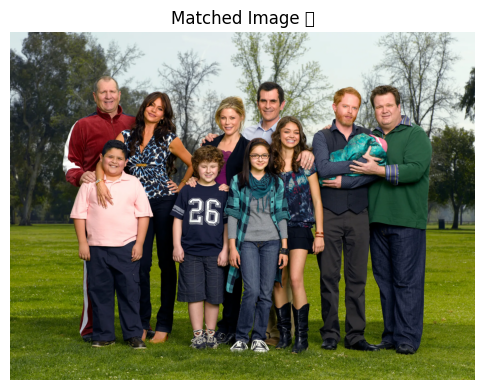

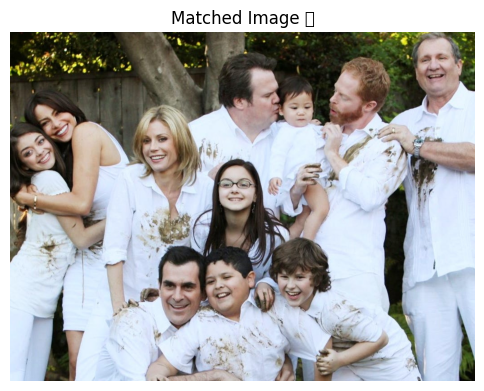

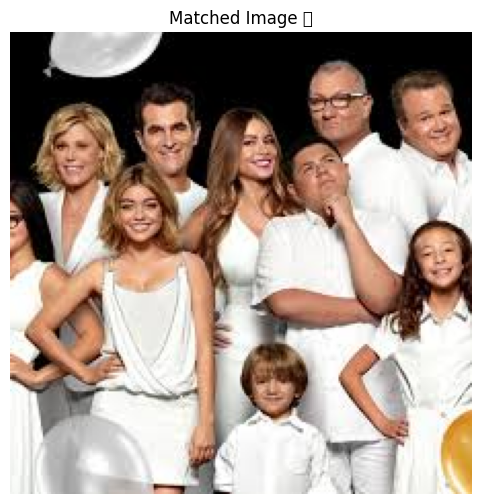

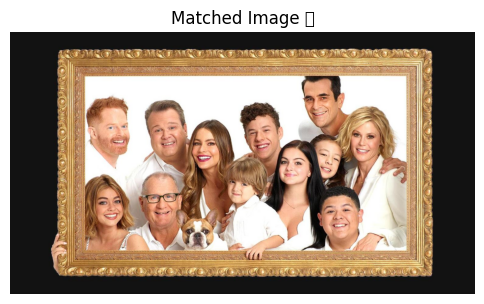

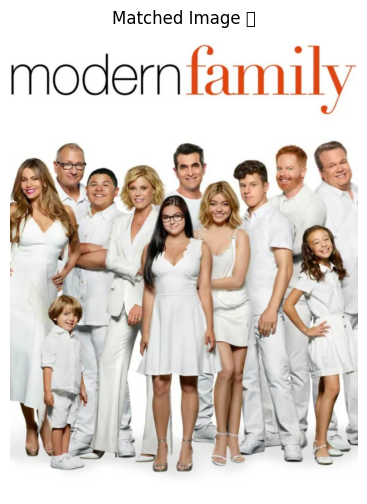

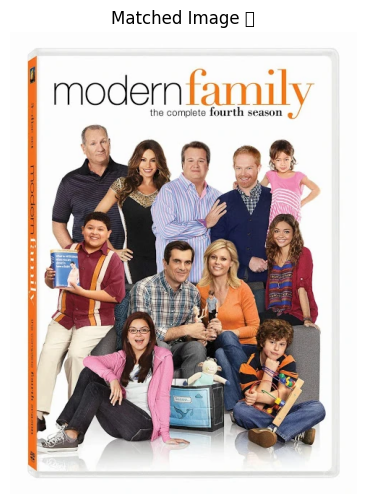

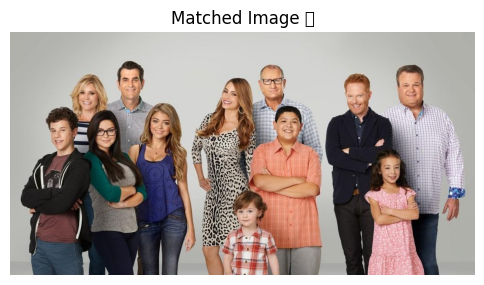

❌ Total Unmatched Images: 0


In [ ]:


# ========== STEP 1: Authenticate Google Drive API ==========
SCOPES = ['https://www.googleapis.com/auth/drive']
SERVICE_ACCOUNT_FILE = 'credentials.json'  # Replace with your JSON key file

creds = service_account.Credentials.from_service_account_file(SERVICE_ACCOUNT_FILE, scopes=SCOPES)
drive_service = build('drive', 'v3', credentials=creds)

# ========== STEP 2: Download Only Missing Images ==========
def download_images_from_drive(folder_id, local_folder="downloaded_images"):
    if not os.path.exists(local_folder):
        os.makedirs(local_folder)

    # Get a list of already downloaded files
    existing_files = set(os.listdir(local_folder))

    query = f"'{folder_id}' in parents and mimeType contains 'image/'"
    results = drive_service.files().list(q=query, fields="files(id, name)").execute()
    files = results.get('files', [])

    image_paths = []
    for file in files:
        file_name = file['name']
        file_path = os.path.join(local_folder, file_name)

        if file_name in existing_files:
            print(f"🔹 {file_name} already exists. Skipping download.")
            image_paths.append(file_path)
            continue  # Skip already downloaded files

        # Download new images
        file_id = file['id']
        request = drive_service.files().get_media(fileId=file_id)
        
        with open(file_path, 'wb') as f:
            downloader = MediaIoBaseDownload(f, request)
            done = False
            while not done:
                _, done = downloader.next_chunk()

        print(f"✅ Downloaded {file_name}")
        image_paths.append(file_path)

    return image_paths

# ========== STEP 3: Face Detection Function ==========
def detect_faces(image_path):
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    return img, faces

# ========== STEP 4: Face Matching Function ==========
def match_faces(reference_image, group_photos, model_name="Facenet"):
    ref_embedding = DeepFace.represent(reference_image, model_name=model_name)[0]["embedding"]
    
    matched_images = []
    unmatched_images = []

    for img_path in group_photos:
        img, faces = detect_faces(img_path)
        matched = False

        for (x, y, w, h) in faces:
            face_crop = img[y:y+h, x:x+w]
            try:
                group_embedding = DeepFace.represent(face_crop, model_name=model_name)[0]["embedding"]
                similarity = np.dot(ref_embedding, group_embedding) / (np.linalg.norm(ref_embedding) * np.linalg.norm(group_embedding))

                if similarity > 0.6:  # Matching threshold
                    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 4)  # Thicker bounding box
                    matched_images.append(img)
                    matched = True
                    break  # Stop checking further faces if one matches
            except:
                continue

        if not matched:
            unmatched_images.append(img)

    return matched_images, unmatched_images

# ========== STEP 5: Run Face Matching ==========
reference_image_path = "https://a1cf74336522e87f135f-2f21ace9a6cf0052456644b80fa06d4f.ssl.cf2.rackcdn.com/images/characters/large/800/Phil-Dunphy.Modern-Family.webp"  # Change to your reference image
google_drive_folder_id = "1Ck-RHRZVNSCqUUismv_XXg4_jAaTWRRk"  # Replace with your Drive folder ID

# Download only missing images from Drive
group_photos = download_images_from_drive(google_drive_folder_id)

# Perform Face Matching
matched_images, unmatched_images = match_faces(reference_image_path, group_photos)

# ========== STEP 6: Display Matched & Unmatched Images ==========
print(f"✅ Total Matched Images: {len(matched_images)}")
for img in matched_images:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title("Matched Image ✅")
    plt.show()

print(f"❌ Total Unmatched Images: {len(unmatched_images)}")
for img in unmatched_images:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title("Unmatched Image ❌")
    plt.show()


✅ Matched Images:


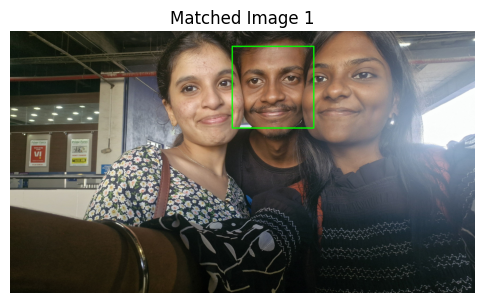

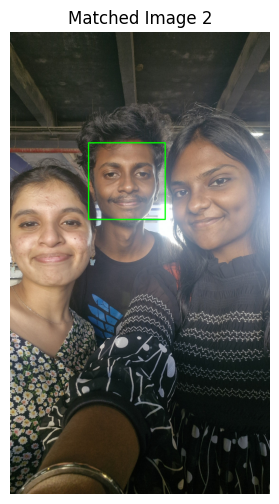

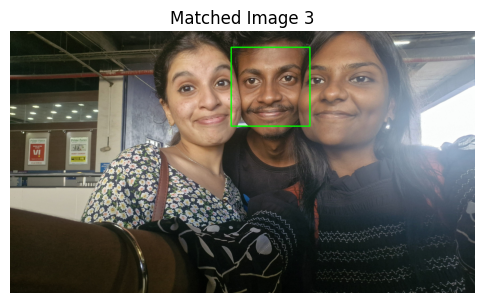

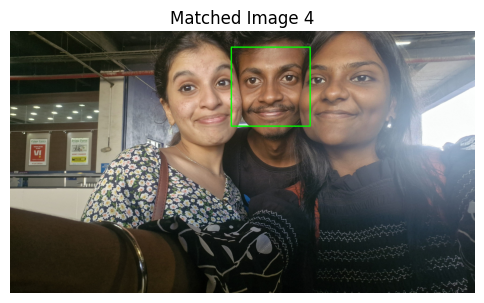

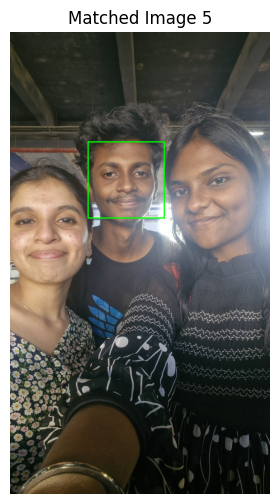

...

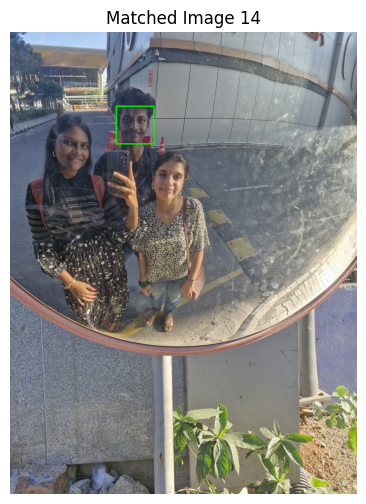

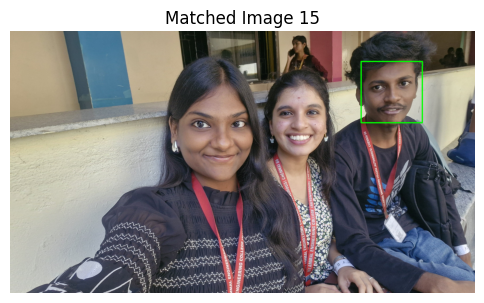

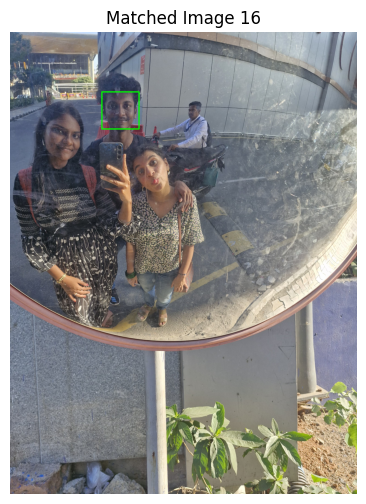

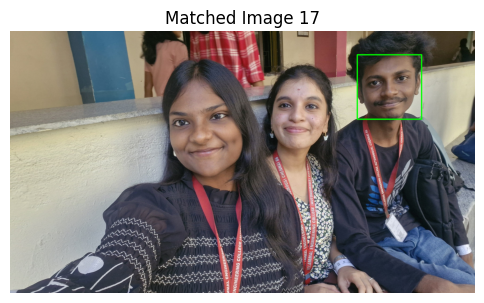

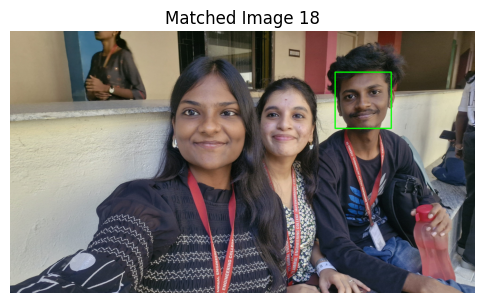


❌ Non-Matched Images:


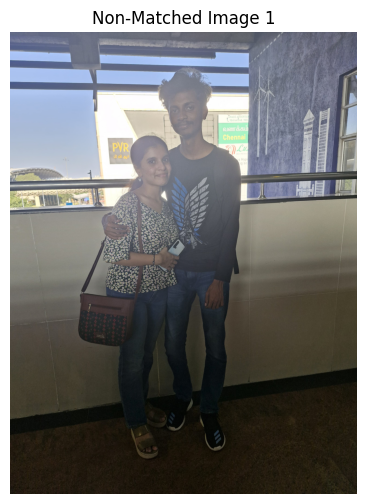

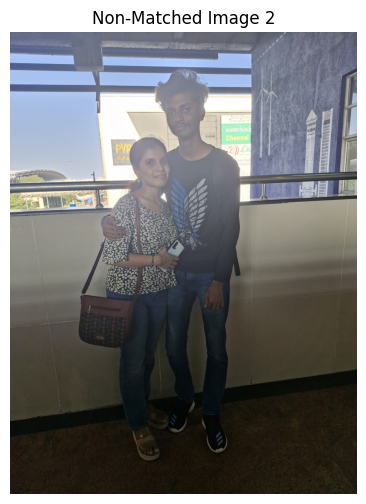

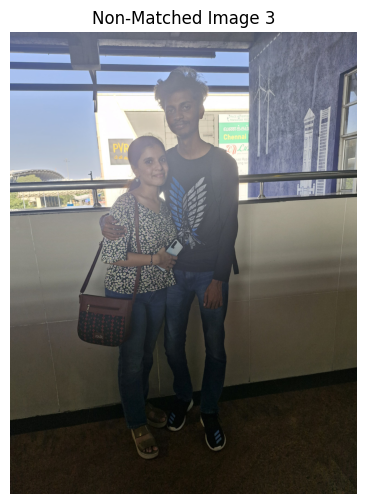

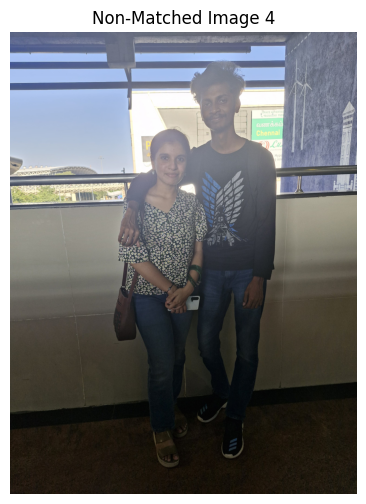

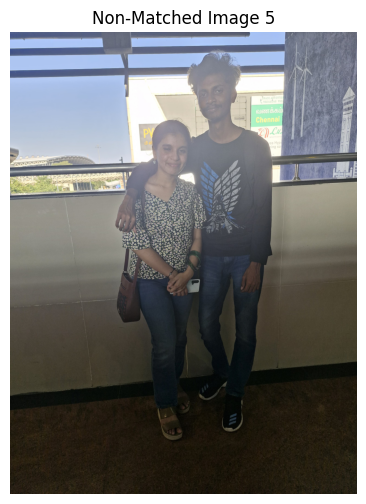

...

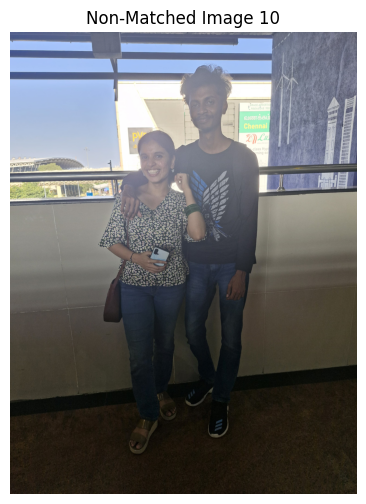

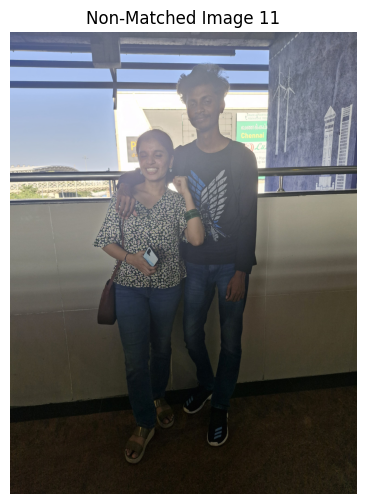

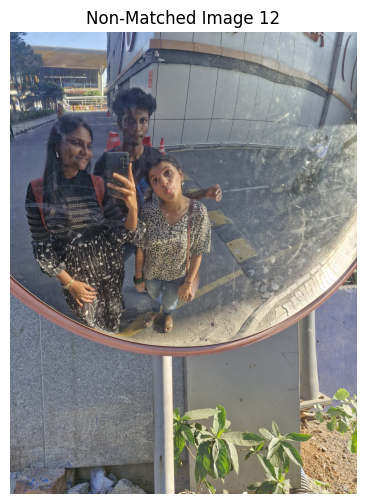

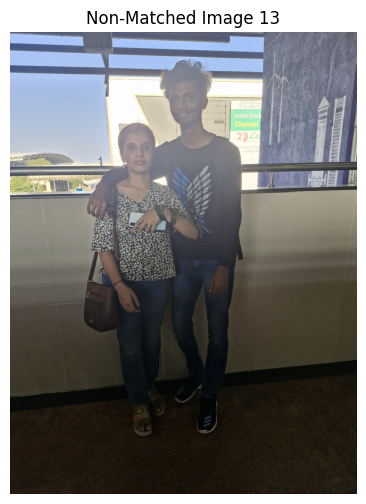

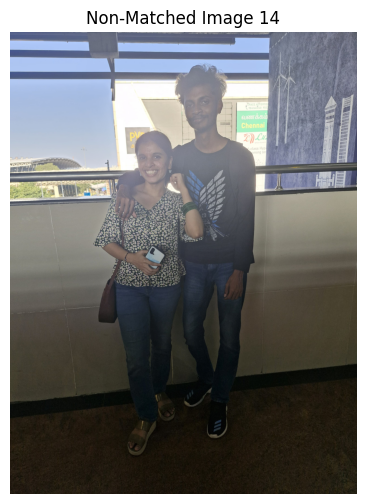

✅ Total Matched Photos: 18
❌ Total Non-Matched Photos: 14
